In [1]:
# Cell 1: Imports
import numpy as np
import pandas as pd
import re
from pathlib import Path
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder
from collections import deque
import random
from tqdm.notebook import tqdm
import os
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import shap
import plotly.express as px

In [2]:
# Cell 2: Load and Clean Data

# Load the data
base_path = Path.cwd()
news_path = base_path / 'news.tsv'
behaviors_path = base_path / 'behaviors.tsv'

news = pd.read_csv(
    news_path,
    sep='\t',
    names=[
        'news_id',
        'category',
        'subcategory',
        'title',
        'abstract',
        'url',
        'title_entities',
        'abstract_entities'
    ]
)
behaviors = pd.read_csv(
    behaviors_path,
    sep='\t',
    names=['impression_id', 'user_id', 'time', 'history', 'impressions']
)

# Data Cleaning
news.fillna(
    {
        'category': 'unknown',
        'subcategory': 'general',
        'title': 'Missing Title',
        'abstract': 'Missing Abstract'
    },
    inplace=True
)
news.dropna(subset=['category', 'subcategory', 'title', 'abstract'], inplace=True)
behaviors.dropna(subset=['history', 'impressions'], inplace=True)

# Remove duplicates
news.drop_duplicates(subset=['title', 'abstract'], inplace=True)
behaviors.drop_duplicates(subset=['impression_id'], inplace=True)

In [3]:
# Cell 3: Text Preprocessing

def clean_text(text):
    """Clean text by removing special characters, numbers, and converting to lowercase."""
    text = re.sub(r"n't", " not", text)
    text = re.sub(r"'ll", " will", text)
    text = re.sub(r"'ve", " have", text)
    text = re.sub(r"'re", " are", text)
    text = re.sub(r"'d", " would", text)
    text = re.sub(r"'s", " is", text)
    text = re.sub(r'\W+', ' ', text)  # Remove special characters
    text = re.sub(r'\d+', '', text)   # Remove numbers
    return text.lower()

def remove_stopwords_and_lemmatize(text):
    """Remove stopwords and perform basic lemmatization."""
    stopwords = set([
        'the', 'and', 'is', 'in', 'to', 'of', 'a', 'an', 'on', 'for', 'with',
        'as', 'by', 'at', 'from', 'this', 'that', 'it', 'or', 'but', 'not',
        'be', 'are', 'was', 'were', 'can', 'will', 'would', 'should', 'has',
        'have', 'had', 'do', 'does', 'did', 'which', 'if', 'then', 'than',
        'so', 'such', 'there', 'about', 'into', 'over', 'after'
    ])
    words = text.split()
    lemmatized = [word[:-1] if word.endswith('s') else word for word in words]
    return " ".join(word for word in lemmatized if word not in stopwords)

def preprocess_text(text):
    """Full preprocessing pipeline: clean text, remove stopwords, and lemmatize."""
    cleaned_text = clean_text(text)
    return remove_stopwords_and_lemmatize(cleaned_text)

def preprocess_text_parallel(texts):
    return [preprocess_text(text) for text in tqdm(texts, desc="Text Preprocessing")]

# Clean Title and Abstract
news['clean_title'] = preprocess_text_parallel(news['title'])
news['clean_abstract'] = preprocess_text_parallel(news['abstract'])

Text Preprocessing:   0%|          | 0/50669 [00:00<?, ?it/s]

Text Preprocessing:   0%|          | 0/50669 [00:00<?, ?it/s]

In [4]:
# Cell 4: Encode Users and News IDs

user_encoder = LabelEncoder()
news_encoder = LabelEncoder()

behaviors['user_id_enc'] = user_encoder.fit_transform(behaviors['user_id'])
news['news_id_enc'] = news_encoder.fit_transform(news['news_id'])

# Save the encoders
import joblib
joblib.dump(user_encoder, 'user_encoder.joblib')
joblib.dump(news_encoder, 'news_encoder.joblib')

['news_encoder.joblib']

In [5]:
# Cell 5: Create Interaction Data
def parse_impressions(impressions_str):
    """Parse impressions and extract news IDs and labels."""
    impressions = impressions_str.split(' ')
    interactions = [impression.split('-') for impression in impressions]
    return interactions  # List of [news_id, label]

tqdm.pandas(desc="Parsing Impressions")
behaviors['interactions'] = behaviors['impressions'].progress_apply(parse_impressions)

# Explode the 'interactions' column to get one row per interaction
interactions_df = behaviors[['user_id_enc', 'interactions']].explode('interactions')

# Create separate columns for 'news_id_str' and 'label'
interactions_df[['news_id_str', 'label']] = pd.DataFrame(
    interactions_df['interactions'].tolist(), index=interactions_df.index
)

# Convert 'label' to Integer
interactions_df['label'] = interactions_df['label'].astype(int)

# Remove the 'interactions' column as it's no longer needed
interactions_df.drop(columns=['interactions'], inplace=True)

# Check which 'news_id_str's exist in the 'news_encoder'
interactions_df['news_id_in_encoder'] = interactions_df['news_id_str'].isin(news_encoder.classes_)

# Skip interactions with unknown 'news_id's
interactions_df = interactions_df[interactions_df['news_id_in_encoder']].copy()

# Transform 'news_id_str' into 'news_id_enc' using the 'news_encoder'
interactions_df['news_id_enc'] = news_encoder.transform(interactions_df['news_id_str'])

# Remove the original string columns
interactions_df.drop(columns=['news_id_str', 'news_id_in_encoder'], inplace=True)

# Rename the columns
interactions_df.rename(columns={'user_id_enc': 'user_id', 'news_id_enc': 'news_id'}, inplace=True)

# Select the required columns
interactions_df = interactions_df[['user_id', 'news_id', 'label']]

# Progress indicator for completion of processing
print("Interaction data successfully created.")

# Save the interaction data
interactions_df.to_csv('interactions_df.csv', index=False)
print("Interaction data saved to 'interactions_df.csv'.")

Parsing Impressions:   0%|          | 0/153727 [00:00<?, ?it/s]

Interaction data successfully created.
Interaction data saved to 'interactions_df.csv'.


In [6]:
# Cell 6: Build User and Item Features

num_users = behaviors['user_id_enc'].nunique()
num_items = news['news_id_enc'].nunique()

print(f"Number of users: {num_users}")
print(f"Number of items: {num_items}")

Number of users: 49108
Number of items: 50669


In [7]:
# Cell 7: Define the DQN Model
class DQN(nn.Module):
    def __init__(self, num_users, num_items, embedding_dim=128):
        super(DQN, self).__init__()
        self.user_embedding = nn.Embedding(num_users, embedding_dim)
        self.item_embedding = nn.Embedding(num_items, embedding_dim)
        self.fc1 = nn.Linear(embedding_dim * 2, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 64)
        self.output = nn.Linear(64, 1)  # Output is Q-value
        self.dropout = nn.Dropout(0.3)
        self.batch_norm1 = nn.BatchNorm1d(256)
        self.batch_norm2 = nn.BatchNorm1d(128)

    def forward(self, user_ids, item_ids):
        user_embeds = self.user_embedding(user_ids)
        item_embeds = self.item_embedding(item_ids)
        x = torch.cat([user_embeds, item_embeds], dim=1)
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = F.relu(self.fc3(x))
        q_values = self.output(x)
        return q_values.squeeze()

# Cell 8: Initialize Model and Parameters (with optimizations)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
embedding_dim = 256  
model = DQN(num_users, num_items, embedding_dim).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0002) 
criterion = nn.MSELoss()

# Experience replay buffer
replay_buffer = deque(maxlen=100000)
batch_size = 256  

gamma = 0.9       
epsilon = 1.0      
epsilon_min = 0.1
epsilon_decay = 0.99  
num_epochs = 3    

# Checkpoint directory
checkpoint_dir = 'checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)


In [8]:
# Cell 9: Preparation of DataLoaders
# Load interactions from saved file
if os.path.exists('interactions_df.csv'):
    interactions_df = pd.read_csv(
        'interactions_df.csv',
        dtype={'user_id': int, 'news_id': int, 'label': float}
    )
# Check the loaded DataFrame
print("First 5 rows of interactions_df:")
print(interactions_df.head())
print("\nData types:")
print(interactions_df.dtypes)

# Shuffle and split interactions into training and validation sets
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(interactions_df, test_size=0.1, random_state=42)

# Create PyTorch datasets
class InteractionDataset(torch.utils.data.Dataset):
    def __init__(self, df):
        self.user_ids = torch.tensor(df['user_id'].values, dtype=torch.long)
        self.item_ids = torch.tensor(df['news_id'].values, dtype=torch.long)
        self.labels = torch.tensor(df['label'].values, dtype=torch.float)
        
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        return self.user_ids[idx], self.item_ids[idx], self.labels[idx]

train_dataset = InteractionDataset(train_df)
val_dataset = InteractionDataset(val_df)

# Data loaders
train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=0
)
val_loader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=0
)

print("\nDataLoader created:")
print(f"Number of training examples: {len(train_dataset)}")
print(f"Number of validation examples: {len(val_dataset)}")

First 5 rows of interactions_df:
   user_id  news_id  label
0     2201    39371    1.0
1     2201    22161    0.0
2    47474     9250    0.0
3    47474    25309    0.0
4    47474    41443    0.0

Data types:
user_id      int32
news_id      int32
label      float64
dtype: object

DataLoader created:
Number of training examples: 5103976
Number of validation examples: 567109


In [9]:
from torch.nn.functional import one_hot

# Target network for stable training
target_model = DQN(num_users, num_items, embedding_dim).to(device)
target_model.load_state_dict(model.state_dict())
target_model.eval()

step = 0

# Frequency of updating the target network (in steps)
target_update_freq = 1000  # Update the target network every 1000 steps

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train()
    train_loss = 0.0

    train_progress = tqdm(train_loader, desc="Training", leave=False)
    for user_ids_batch, item_ids_batch, labels_batch in train_progress:
        user_ids_batch = user_ids_batch.to(device)
        item_ids_batch = item_ids_batch.to(device)
        labels_batch = labels_batch.to(device)

        # Epsilon-greedy action selection
        if random.random() < epsilon:
            # Explore: select random items
            random_item_ids = torch.randint(0, num_items, item_ids_batch.size()).long().to(device)
            item_ids_batch = random_item_ids

        # Current Q-values
        q_values = model(user_ids_batch, item_ids_batch)

        # Simulate reward (use labels as rewards)
        rewards = labels_batch

        # Terminal state handling
        done_flags = (labels_batch == 0).float()  # Assuming label 0 indicates a terminal state

        # Generate new batch for next state Q-value estimation (Double Q-Learning)
        num_top_k_items = 500  # Limit the number of items evaluated for next state
        next_item_ids_sampled = torch.randint(0, num_items, (num_top_k_items,)).long().to(device)

        # Expand user batch for sampled items
        user_ids_expanded = user_ids_batch.unsqueeze(1).repeat(1, num_top_k_items).flatten()
        next_item_ids_expanded = next_item_ids_sampled.repeat(user_ids_batch.size(0))

        # Next state Q-values using Double Q-learning approach
        with torch.no_grad():
            next_q_values_sampled = model(user_ids_expanded, next_item_ids_expanded)
            next_q_values_sampled = next_q_values_sampled.view(user_ids_batch.size(0), num_top_k_items)

            # Select the best action for each user in the batch
            next_actions = next_q_values_sampled.argmax(dim=1)
            next_q_values = next_q_values_sampled.gather(1, next_actions.unsqueeze(1)).squeeze()

        # Compute target Q-values
        target_q_values = rewards + gamma * next_q_values * (1 - done_flags)

        # Compute loss
        loss = criterion(q_values, target_q_values)

        # Optimize the model
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        step += 1

        # Adaptive target network update based on steps
        if step % target_update_freq == 0:
            target_model.load_state_dict(model.state_dict())

        train_progress.set_postfix({'Loss': loss.item()})

    avg_train_loss = train_loss / len(train_loader)
    print(f"Average Training Loss: {avg_train_loss:.4f}")

    # Decay epsilon
    if epsilon > epsilon_min:
        epsilon = max(epsilon * epsilon_decay, epsilon_min)

    # Save checkpoint
    checkpoint_path = os.path.join(checkpoint_dir, f'model_epoch_{epoch+1}.pt')
    torch.save({
        'epoch': epoch + 1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epsilon': epsilon,
    }, checkpoint_path)
    print(f"Checkpoint saved at {checkpoint_path}")


Epoch 1/3


Training:   0%|          | 0/19938 [00:00<?, ?it/s]

Average Training Loss: 0.0441
Checkpoint saved at checkpoints\model_epoch_1.pt
Epoch 2/3


Training:   0%|          | 0/19938 [00:00<?, ?it/s]

Average Training Loss: 0.0428
Checkpoint saved at checkpoints\model_epoch_2.pt
Epoch 3/3


Training:   0%|          | 0/19938 [00:00<?, ?it/s]

Average Training Loss: 0.0433
Checkpoint saved at checkpoints\model_epoch_3.pt


In [10]:
# Cell 11: Validation Loop

model.eval()
val_loss = 0.0
with torch.no_grad():
    val_progress = tqdm(val_loader, desc="Validation", leave=False)
    for user_ids_batch, item_ids_batch, labels_batch in val_progress:
        user_ids_batch = user_ids_batch.to(device)
        item_ids_batch = item_ids_batch.to(device)
        labels_batch = labels_batch.to(device)

        q_values = model(user_ids_batch, item_ids_batch)
        rewards = labels_batch
        next_q_values = target_model(user_ids_batch, item_ids_batch).detach()
        target_q_values = rewards + gamma * next_q_values

        loss = criterion(q_values, target_q_values)
        val_loss += loss.item()

        val_progress.set_postfix({'Loss': loss.item()})

    avg_val_loss = val_loss / len(val_loader)
    print(f"Average Validation Loss: {avg_val_loss:.4f}")

Validation:   0%|          | 0/2216 [00:00<?, ?it/s]

Average Validation Loss: 0.0397


In [11]:
# Cell 12: Making Recommendations

def recommend(user_id, top_k=5, return_similarities=False):
    model.eval()
    user_id_tensor = torch.tensor([user_id]).long().to(device)
    all_item_ids = torch.arange(num_items).long().to(device)
    
    with torch.no_grad():
        user_ids_batch = user_id_tensor.repeat(num_items)
        q_values = model(user_ids_batch, all_item_ids)
    
    # Get top K items with highest Q-values
    top_k_items = torch.topk(q_values, top_k).indices.cpu().numpy()
    recommended_news_ids = news_encoder.inverse_transform(top_k_items)
    
    if return_similarities:
        return recommended_news_ids, similarities[top_k_indices]
    else:
        return recommended_news_ids

# Example recommendation for a user
sample_user_id = 0  # Replace with a valid user_id index
recommended_items = recommend(sample_user_id, top_k=5)
print(f"Recommended items for user {sample_user_id}: {recommended_items}")


Recommended items for user 0: ['N55689' 'N4687' 'N16129' 'N17116' 'N29911']


In [12]:
# Cell 13: Detailed Evaluation with Precision Calculation (with enhancements)

# Combine news IDs from training and validation data to fit the encoder
all_news_ids = pd.concat([train_df['news_id'], val_df['news_id']]).unique()
news_encoder = LabelEncoder()
news_encoder.fit(all_news_ids)

# Evaluate on a subset of users
import random

# Stratified sampling to include users with positive interactions
evaluate_user_ids = val_df[val_df['label'] == 1]['user_id'].unique()
if len(evaluate_user_ids) > 100:
    evaluate_user_ids = random.sample(list(evaluate_user_ids), 100)  # Sample 100 users with positive interactions
else:
    print("Warning: Less than 100 users with positive interactions found.")

valid_user_count = 0
precision_list = []
k = 5  # Precision@k

def recommend(user_id, top_k=5, return_similarities=False):
    model.eval()
    user_id_tensor = torch.tensor([user_id]).long().to(device)
    all_item_ids = torch.arange(len(news_encoder.classes_)).long().to(device)

    with torch.no_grad():
        user_ids_batch = user_id_tensor.repeat(len(news_encoder.classes_))
        q_values = model(user_ids_batch, all_item_ids)

    # Get top K items with highest Q-values
    top_k_items = torch.topk(q_values, top_k).indices.cpu().numpy()
    recommended_news_ids = news_encoder.inverse_transform(top_k_items)

    if return_similarities:
        return recommended_news_ids, q_values[top_k_items].cpu().numpy()
    else:
        return recommended_news_ids

for user_id in evaluate_user_ids:
    # Retrieve the items that the user interacted with positively in the validation set
    user_interactions = val_df[val_df['user_id'] == user_id]
    positive_items = user_interactions[user_interactions['label'] == 1]['news_id'].values

    # Debugging information: Print user positive items
    print(f"User {user_id} positive items before filtering: {positive_items}")

    # Filter and transform positive items
    valid_positive_mask = np.isin(positive_items, news_encoder.classes_)
    valid_positive_items = positive_items[valid_positive_mask]

    # Debugging information: Print valid positive items after filtering
    print(f"User {user_id} valid positive items after filtering: {valid_positive_items}")

    if len(valid_positive_items) == 0:
        # Log users that have no valid positive items in the validation set
        print(f"User {user_id} has no valid positive items.")
        continue  # Skip if no valid positive items are present

    # Encode the valid positive items using the news encoder
    valid_positive_items_encoded = news_encoder.transform(valid_positive_items)

    # Retrieve the top k recommended items for the user using the recommend function
    top_k_items = recommend(user_id, k)

    # Debugging information: Print recommended items
    print(f"User {user_id} top-{k} recommended items: {top_k_items}")

    # Compute precision for this user
    num_relevant = len(set(top_k_items) & set(valid_positive_items_encoded))
    precision = num_relevant / k
    precision_list.append(precision)
    valid_user_count += 1

# Calculate and print the average precision
if len(precision_list) > 0:
    avg_precision = np.mean(precision_list)
    print(f"Average Precision@{k}: {avg_precision:.4f}")
else:
    print("No valid users to evaluate.")

print(f"Number of valid users evaluated: {valid_user_count}/{len(evaluate_user_ids)}")


User 3995 positive items before filtering: [33842]
User 3995 valid positive items after filtering: [33842]
User 3995 top-5 recommended items: [ 7271  6260 32714 41199  9517]
User 13384 positive items before filtering: [37536]
User 13384 valid positive items after filtering: [37536]
User 13384 top-5 recommended items: [15897 32714 36294   963 42859]
User 16990 positive items before filtering: [39371]
User 16990 valid positive items after filtering: [39371]
User 16990 top-5 recommended items: [35500 37907 12877 18435 45159]
User 7550 positive items before filtering: [15063 39816]
User 7550 valid positive items after filtering: [15063 39816]
User 7550 top-5 recommended items: [46081 20202 49080 31711 18435]
User 40821 positive items before filtering: [32645 22161]
User 40821 valid positive items after filtering: [32645 22161]
User 40821 top-5 recommended items: [36693 35500 47023 49080 18435]
User 36347 positive items before filtering: [26236 21243]
User 36347 valid positive items after f

In [13]:
# Cell 14: Extract embeddings for visualization
# Set the model to evaluation mode
model.eval()
# Extract user and item embeddings
user_embeddings = model.user_embedding.weight.data.cpu().numpy()
item_embeddings = model.item_embedding.weight.data.cpu().numpy()
print(f"User embeddings shape: {user_embeddings.shape}")
print(f"Item embeddings shape: {item_embeddings.shape}")

User embeddings shape: (49108, 256)
Item embeddings shape: (50669, 256)


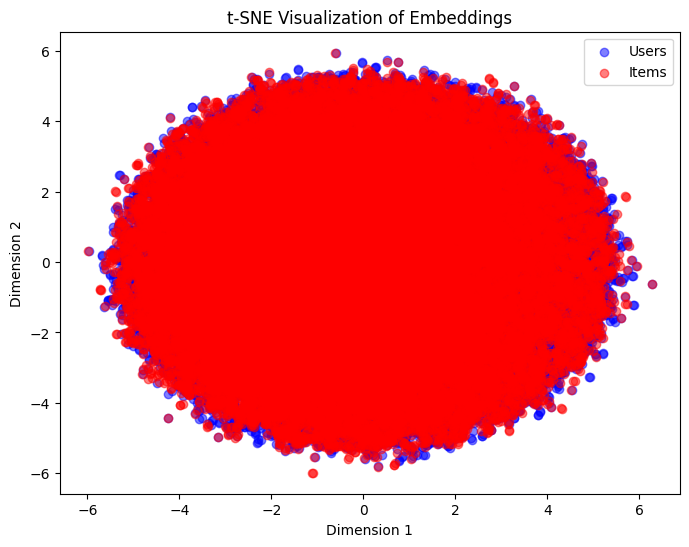

In [14]:
# Cell 15: Visualization of embeddings using t-SNE
# Combine user and item embeddings
all_embeddings = np.vstack([user_embeddings, item_embeddings])
# Use t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(all_embeddings)
# Separate the reduced embeddings
user_embeddings_2d = embeddings_2d[:len(user_embeddings)]
item_embeddings_2d = embeddings_2d[len(user_embeddings):]
# Plot the user embeddings
plt.figure(figsize=(8, 6))
plt.scatter(user_embeddings_2d[:, 0], user_embeddings_2d[:, 1], c='blue', label='Users', alpha=0.5)
plt.scatter(item_embeddings_2d[:, 0], item_embeddings_2d[:, 1], c='red', label='Items', alpha=0.5)
plt.legend()
plt.title('t-SNE Visualization of Embeddings')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

In [15]:
from sklearn.metrics.pairwise import cosine_similarity

# Step 1: Verify Alignment
valid_news_ids = set(news['news_id_enc'])
encoder_ids = set(range(len(news_encoder.classes_)))

missing_in_news = encoder_ids - valid_news_ids
#print(f"IDs in encoder but missing in news: {missing_in_news}")

missing_in_encoder = valid_news_ids - encoder_ids
#print(f"IDs in news but missing in encoder: {missing_in_encoder}")

# Step 2: Filter and Refit Encoder
valid_news_ids = news['news_id'].unique()
news_encoder = LabelEncoder()
news_encoder.fit(valid_news_ids)

# Update encoded column
news['news_id_enc'] = news_encoder.transform(news['news_id'])

# Save the updated encoder
joblib.dump(news_encoder, 'news_encoder.joblib')

# Step 3: Update Recommendation Logic
valid_indices = np.arange(len(news_encoder.classes_))
item_embeddings_filtered = item_embeddings[valid_indices]

# Compute Recommendations
sample_user_id = 32204
user_embed = user_embeddings[sample_user_id].reshape(1, -1)
similarities = cosine_similarity(user_embed, item_embeddings_filtered).flatten()

top_k = 5
top_k_indices = similarities.argsort()[-top_k:][::-1]
top_k_news_ids = [news_encoder.classes_[idx] for idx in top_k_indices]

# Display Recommendations
print(f"Recommended articles for user {sample_user_id}:")
for idx in top_k_indices:
    news_id = news_encoder.classes_[idx]
    similarity = similarities[idx]
    
    news_row = news[news['news_id'] == news_id]
    if news_row.empty:
        print(f"Article ID: {news_id}, Similarity: {similarity:.4f}, Title: Not Found")
        continue
    
    title = news_row['title'].values[0]
    print(f"Article ID: {news_id}, Similarity: {similarity:.4f}, Title: {title}")

Recommended articles for user 32204:
Article ID: N64332, Similarity: 0.2802, Title: Archbishop Joseph Kurtz updates his condition, says surgery was successful
Article ID: N54597, Similarity: 0.2755, Title: First look at 2020 Toyko Olympic course, which is ready for the Games
Article ID: N52355, Similarity: 0.2572, Title: Cincinnati Zoo pairs up cute rescue dog Remus and baby cheetah Kris for a 'BFF sleepover'
Article ID: N46578, Similarity: 0.2488, Title: Celtics' Tacko Fall, Tremont Waters Reenact Manute Bol-Muggsy Bogues Photos
Article ID: N44767, Similarity: 0.2445, Title: Nashville police arrest fifth suspect in Maplewood High student death


In [16]:
import shap

# Define the model prediction wrapper for SHAP
def model_predict(user_item_array):
    user_ids = torch.tensor(user_item_array[:, 0], dtype=torch.long).to(device)
    item_ids = torch.tensor(user_item_array[:, 1], dtype=torch.long).to(device)
    with torch.no_grad():
        output = model(user_ids, item_ids).cpu().numpy()
    return output.flatten()  # Ensure the output is 1D

# Select a sample of user-item combinations
num_samples = 1000
user_ids_sample = np.random.choice(num_users, num_samples)
item_ids_sample = np.random.choice(num_items, num_samples)
X_sample = np.vstack([user_ids_sample, item_ids_sample]).T

# Create the SHAP explainer
explainer = shap.KernelExplainer(model_predict, X_sample)

# Select an instance to explain
sample_idx = 0
X_explain = X_sample[sample_idx].reshape(1, -1)

# Compute the SHAP values
shap_values = explainer.shap_values(X_explain, nsamples=100)

# Display the SHAP values
feature_names = ['User ID', 'Item ID']
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_explain, feature_names=feature_names)

Using 1000 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
# Zelle 18: Interaktive Plot of Embeddings

# DataFrame for Embeddings
user_df = pd.DataFrame(user_embeddings_2d, columns=['Dim1', 'Dim2'])
user_df['Type'] = 'User'
user_df['ID'] = range(len(user_embeddings_2d))

item_df = pd.DataFrame(item_embeddings_2d, columns=['Dim1', 'Dim2'])
item_df['Type'] = 'Article'
item_df['ID'] = range(len(item_embeddings_2d))

embedding_df = pd.concat([user_df, item_df], ignore_index=True)

# Scatter-Plot
fig = px.scatter(
    embedding_df,
    x='Dim1',
    y='Dim2',
    color='Type',
    hover_data=['ID'],
    title='Plot of Embeddings'
)
fig.show()

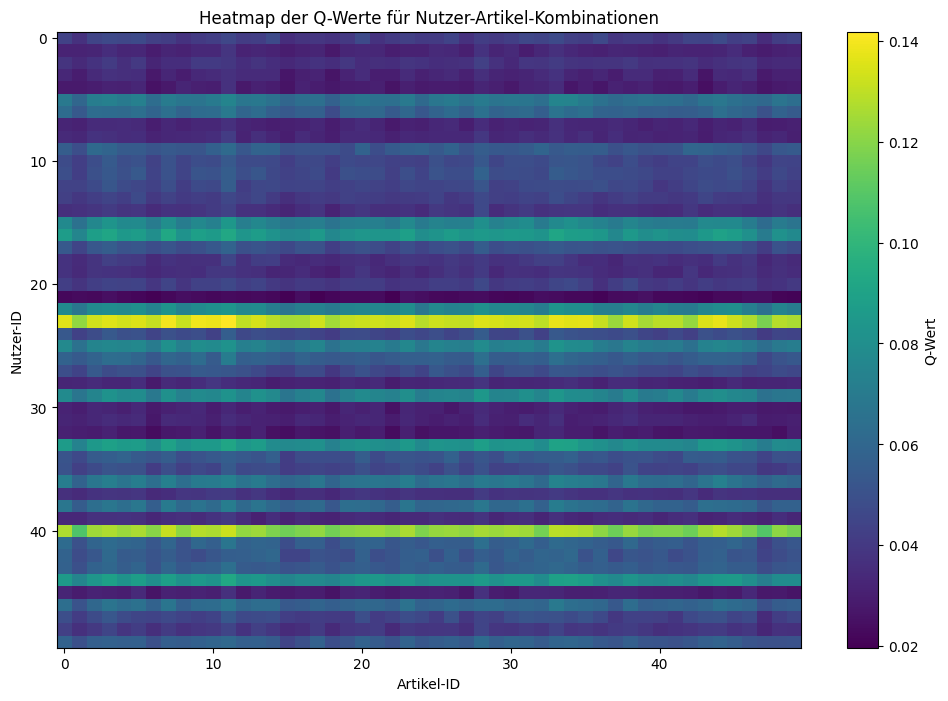

In [18]:
# Zelle 19: Heatmap Q-Values

# Sample Users
num_users_heatmap = 50
num_items_heatmap = 50
user_ids_heatmap = torch.tensor(range(num_users_heatmap)).long().to(device)
item_ids_heatmap = torch.tensor(range(num_items_heatmap)).long().to(device)
user_ids_grid, item_ids_grid = torch.meshgrid(user_ids_heatmap, item_ids_heatmap, indexing='ij')
user_ids_grid = user_ids_grid.reshape(-1)
item_ids_grid = item_ids_grid.reshape(-1)

# Calculate Q
with torch.no_grad():
    q_values = model(user_ids_grid, item_ids_grid).cpu().numpy()

# Q-Values to Matrix
q_matrix = q_values.reshape(num_users_heatmap, num_items_heatmap)

# Plot Heatmap
plt.figure(figsize=(12, 8))
plt.imshow(q_matrix, aspect='auto', cmap='viridis')
plt.colorbar(label='Q-Wert')
plt.xlabel('Artikel-ID')
plt.ylabel('Nutzer-ID')
plt.title('Heatmap der Q-Werte für Nutzer-Artikel-Kombinationen')
plt.show()

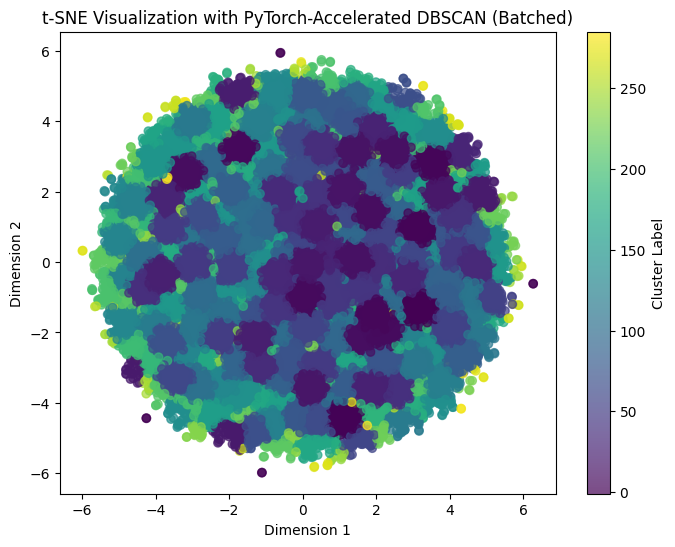

In [21]:
def dbscan_pytorch_batched(data, eps=0.5, min_samples=5, batch_size=1000, device='cuda'):
    """
    DBSCAN implementation in PyTorch with batching to reduce memory usage.
    Args:
        data (torch.Tensor): Input data, shape (n_samples, n_features).
        eps (float): Radius for neighborhood search.
        min_samples (int): Minimum number of samples to form a cluster.
        batch_size (int): Batch size for pairwise distance computation.
        device (str): Device to perform computations ('cuda' or 'cpu').

    Returns:
        cluster_labels (torch.Tensor): Cluster labels for each point, shape (n_samples,).
    """
    # Move data to the specified device
    data = data.to(device)
    n_samples = data.shape[0]
    
    # Initialize cluster labels (-1 means noise)
    cluster_labels = torch.full((n_samples,), -1, dtype=torch.int32, device=device)
    cluster_id = 0  # Initial cluster ID

    # Iterate through each point
    for i in range(n_samples):
        if cluster_labels[i] != -1:  # Skip already visited points
            continue

        # Compute distances for the current point in batches
        neighbors = []
        for start in range(0, n_samples, batch_size):
            end = min(start + batch_size, n_samples)
            batch = data[start:end]
            distances = torch.norm(data[i] - batch, dim=1)
            batch_neighbors = torch.where(distances <= eps)[0] + start
            neighbors.extend(batch_neighbors.tolist())

        neighbor_idxs = torch.tensor(neighbors, device=device)

        # Check if it is a core point
        if len(neighbor_idxs) < min_samples:
            cluster_labels[i] = -1  # Mark as noise
            continue
        
        # Create a new cluster
        cluster_labels[i] = cluster_id
        seeds = neighbor_idxs.tolist()

        # Expand the cluster
        while seeds:
            current_point = seeds.pop()
            if cluster_labels[current_point] == -1:  # Previously labeled as noise
                cluster_labels[current_point] = cluster_id
            if cluster_labels[current_point] != -1:  # Already processed
                continue
            
            cluster_labels[current_point] = cluster_id
            current_neighbors = []
            for start in range(0, n_samples, batch_size):
                end = min(start + batch_size, n_samples)
                batch = data[start:end]
                distances = torch.norm(data[current_point] - batch, dim=1)
                batch_neighbors = torch.where(distances <= eps)[0] + start
                current_neighbors.extend(batch_neighbors.tolist())
            
            current_neighbors = torch.tensor(current_neighbors, device=device)
            if len(current_neighbors) >= min_samples:
                seeds.extend(current_neighbors.tolist())
        
        cluster_id += 1  # Increment cluster ID for the next cluster

    return cluster_labels

# Convert embeddings to PyTorch tensor
data = torch.tensor(embeddings_2d, dtype=torch.float32)

# Run PyTorch-based DBSCAN with batching
cluster_labels = dbscan_pytorch_batched(data, eps=0.5, min_samples=10, batch_size=1000, device='cuda')

# Move results back to CPU for visualization
cluster_labels = cluster_labels.cpu().numpy()

# Plot the clustered embeddings
plt.figure(figsize=(8, 6))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=cluster_labels, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Cluster Label')
plt.title('t-SNE Visualization with PyTorch-Accelerated DBSCAN (Batched)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()